# Advanced Lane Line Finding
---

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


## [Rubric](https://review.udacity.com/#!/rubrics/571/view) Points
---
Here I will consider the rubric points individually and describe how I addressed each point in my implementation.  


In [324]:
import numpy as np
import glob
import cv2
from CameraCalib import FindChessCorners

# List of calibration images in ./camera_cal/calibration*
IMAGES = sorted(glob.glob('.\\camera_cal\\calibration*.jpg'))
images = (cv2.imread(fn) for fn in IMAGES)
objpoints, imgpoints, images = FindChessCorners(images)

In [325]:
for integ in range(len(IMAGES)):
    print(str(integ) + IMAGES[integ])

0.\camera_cal\calibration1.jpg
1.\camera_cal\calibration10.jpg
2.\camera_cal\calibration11.jpg
3.\camera_cal\calibration12.jpg
4.\camera_cal\calibration13.jpg
5.\camera_cal\calibration14.jpg
6.\camera_cal\calibration15.jpg
7.\camera_cal\calibration16.jpg
8.\camera_cal\calibration17.jpg
9.\camera_cal\calibration18.jpg
10.\camera_cal\calibration19.jpg
11.\camera_cal\calibration2.jpg
12.\camera_cal\calibration20.jpg
13.\camera_cal\calibration3.jpg
14.\camera_cal\calibration4.jpg
15.\camera_cal\calibration5.jpg
16.\camera_cal\calibration6.jpg
17.\camera_cal\calibration7.jpg
18.\camera_cal\calibration8.jpg
19.\camera_cal\calibration9.jpg


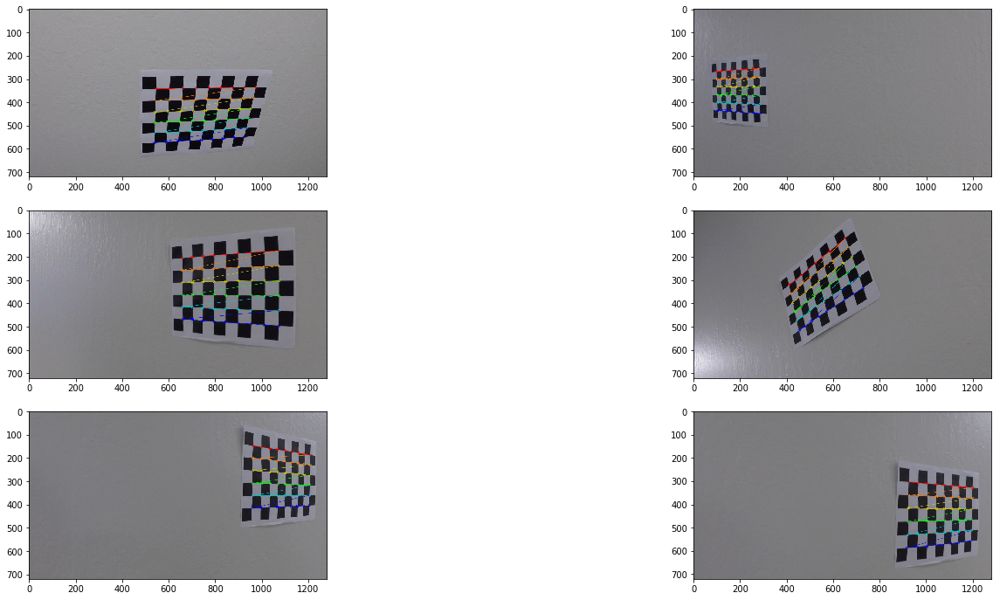

In [326]:
import matplotlib.pyplot as plt
%matplotlib inline

#Plot corner detected images
plt.figure(figsize=(25,12))
for i in range(6):
    plt.subplot(3,2,i+1)
    plt.imshow(images[i])


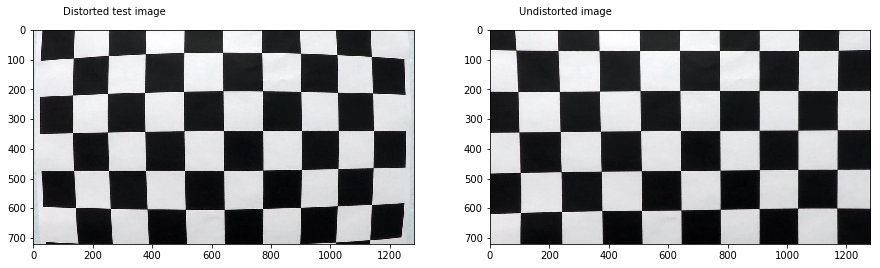

In [87]:
#Step 2 : Apply a distortion correction to raw images
#Camera Calibration and Distortion Coefficients
# objpoints and imgpoints are used to compute the camera calibration and distortion coefficients 
#using the cv2.calibrateCamera() function. 
#Distortion correction is applied using the cv2.undistort() function
#The code for this step is contained in in CameraCalib.py, functions cameraCalib() and UndistImg().

import random
from CameraCalib import cameraCalib, UndistImg
%matplotlib inline


img=images[0]
shape=img.shape[::-1][1:] #cameraCalib accepts width,height. Hence -1
mtx, dist, rvecs, tvecs = cameraCalib(objpoints, imgpoints, shape)
image=cv2.imread('.\\camera_cal\\calibration1.jpg')

#Distorted and Undistorted image after processing
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.text(100, -50, 'Distorted test image')
plt.imshow(image)
plt.subplot(1, 2, 2)
plt.text(100, -50, 'Undistorted image')
plt.imshow(UndistImg(image, mtx, dist))



In [108]:
import numpy as np
import glob
import cv2
from CameraCalib import FindChessCorners

# Make a list of calibration images
testFiles = sorted(glob.glob('.\\test_images\\*.jpg'))

testImgs = [cv2.imread(fn) for fn in testFiles]


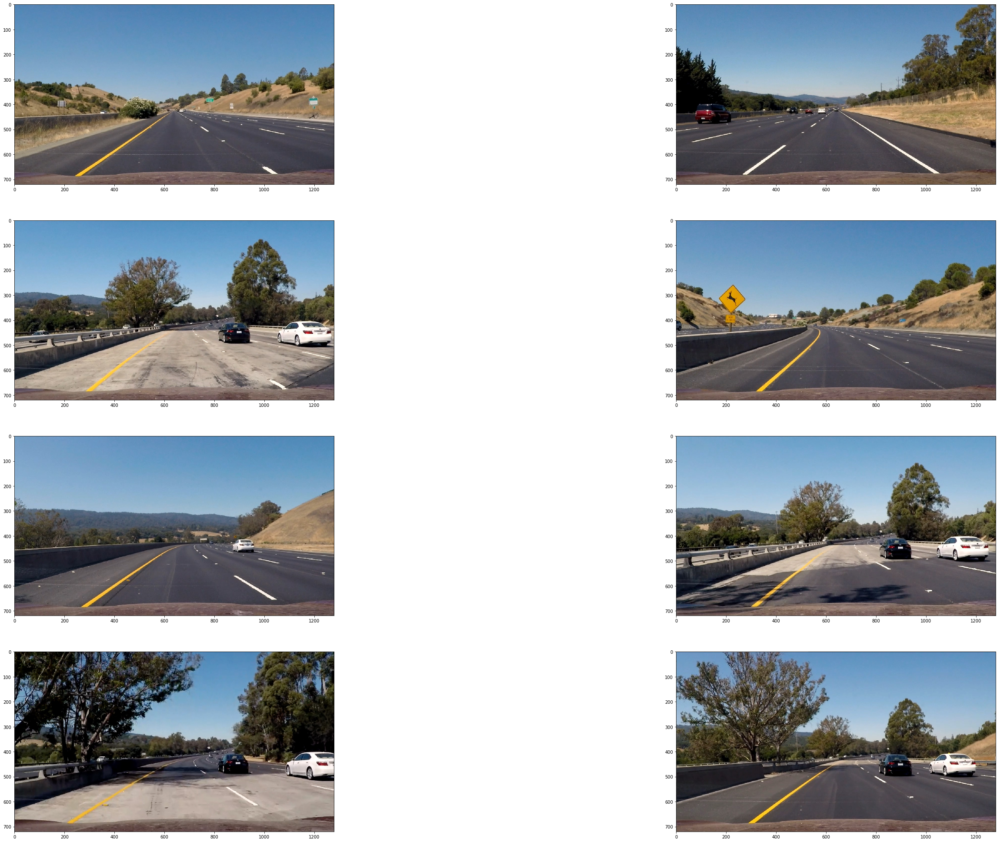

In [109]:
from CameraCalib import bgr2rgb

%matplotlib inline
plt.figure(figsize=(50,35))
for integ in range(len(testImgs)):
    plt.subplot(4, 2, integ+1)
    plt.imshow(bgr2rgb(testImgs[integ]))

### Distortion Correction
- Provide an example of a distortion-corrected image.

In the following, I apply distortion correction to all sample images provided in the test_images folder. Finally I show three samples.

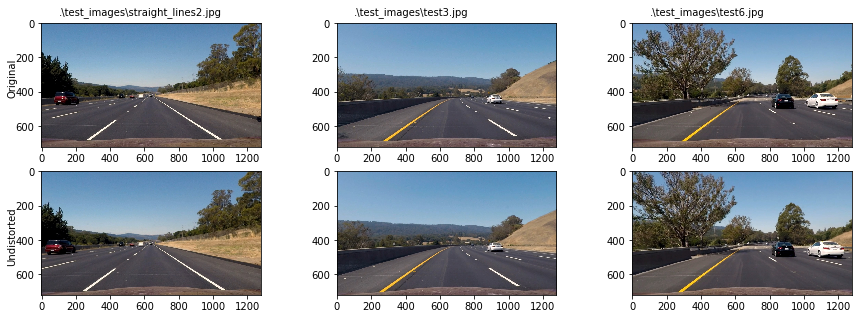

In [116]:
undistTestImgs=[UndistImg(img, mtx, dist) for img in testImgs];

# Test images used : straight_lines2, test3, test6
index = (1,4,7)
plt.figure(figsize=(15,5))
plt.subplot(2, 3, 1)
plt.text(-200, 250, 'Original', rotation=90)
plt.subplot(2, 3, 4)
plt.text(-200, 250, 'Undistorted', rotation=90)
for i in range(0,3):
    plt.subplot(2, 3, i+1)
    
    plt.imshow(bgr2rgb(testImgs[index[i]]))
    plt.text(100, -50, testFiles[index[i]])

    plt.subplot(2, 3, i+4)
    plt.imshow(bgr2rgb(undistTestImgs[index[i]]))


In [124]:
import numpy as np
import cv2
#Sobel function taken most of the content from Udacity lecture course
def Sobel(gray, sobel_kernel=3, alpha=0, thresh=(125, 255)):
    sobelX = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel) #cv2 sobel function
    sobelY = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) #cv2 sobel function
    dX=np.cos(alpha)
    dY=np.sin(alpha)
    Sobel=dX*sobelX+dY*sobelY
    absSobel=np.absolute(Sobel)
    scaledSobel = np.uint8(255*absSobel/np.max(absSobel))
    binaryOutput = np.zeros_like(scaledSobel)
    binaryOutput[(scaledSobel >= thresh[0]) & (scaledSobel <= thresh[1])] = 1
    return binaryOutput, scaledSobel

### Creating a Thresholded Binary Image
- Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result.

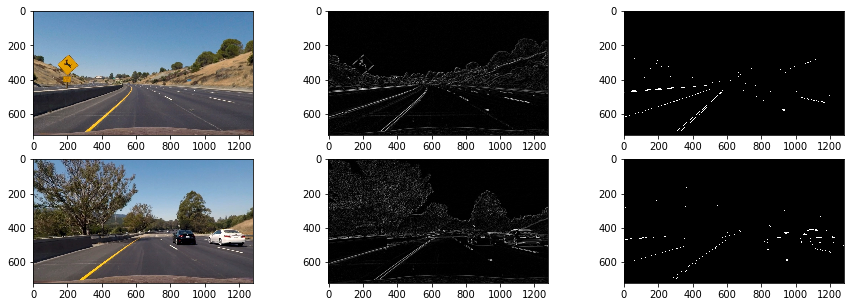

In [126]:
from CameraCalib import bgr2rgb,bgr2gray
#alpha is the angle of lane lines which is kept at almost more than 50 degrees since gradient in x or y doesn't
#consider lane angles atleast.
index=(3, 7)
plt.figure(figsize=(15,5))
for i in (0,1):
    plt.subplot(2, 3, 1+i*3)
    plt.imshow(bgr2rgb(undistTestImgs[index[i]]))
    b, s= Sobel(bgr2gray(undistTestImgs[index[i]]), sobel_kernel=7, alpha=np.arctan(1.333), thresh=(125, 255))
    plt.subplot(2, 3, 2+i*3)
    plt.imshow(s, cmap='gray')
    plt.subplot(2, 3, 3+i*3)
    plt.imshow(b, cmap='gray')

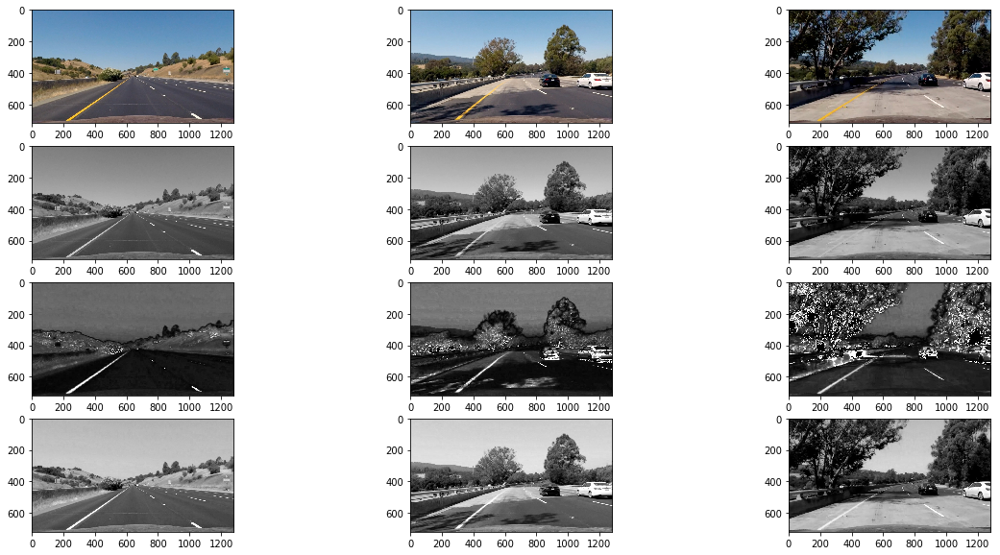

In [140]:
#As in the course, by just transforming to gray scale, much information may be lost. 
#Using color space transfomations helps in order to preserve valuable information as value, saturation or lightness

from CameraCalib import bgr2rgb,bgr2hls,bgr_hsv
#TestImages : Straight_lines1, test4, test5 are used here.
index=(0, 5, 6)
plt.figure(figsize=(20,10))
for i in (0,1,2):
    plt.subplot(4, 3, 1+i)
    plt.imshow(bgr2rgb(undistTestImgs[index[i]])) #convert bgr to rgb format because of cv2
    gray=bgr2gray(undistTestImgs[index[i]])
    plt.subplot(4, 3, 4+i)
    plt.imshow(gray, cmap='gray')
    hls=bgr2hls(undistTestImgs[index[i]])
    plt.subplot(4, 3, 7+i)
    plt.imshow(hls[:,:,2], cmap='gray')
    #hsv=cv2.cvtColor(undistTestImgs[index[i]], cv2.COLOR_BGR2HSV)
    hsv=bgr_hsv(undistTestImgs[index[i]]) #when I defined bgr2hsv as function name, it is not accepting! may be a keyword problem
    plt.subplot(4, 3, 10+i)
    plt.imshow(hsv[:,:,2], cmap='gray')

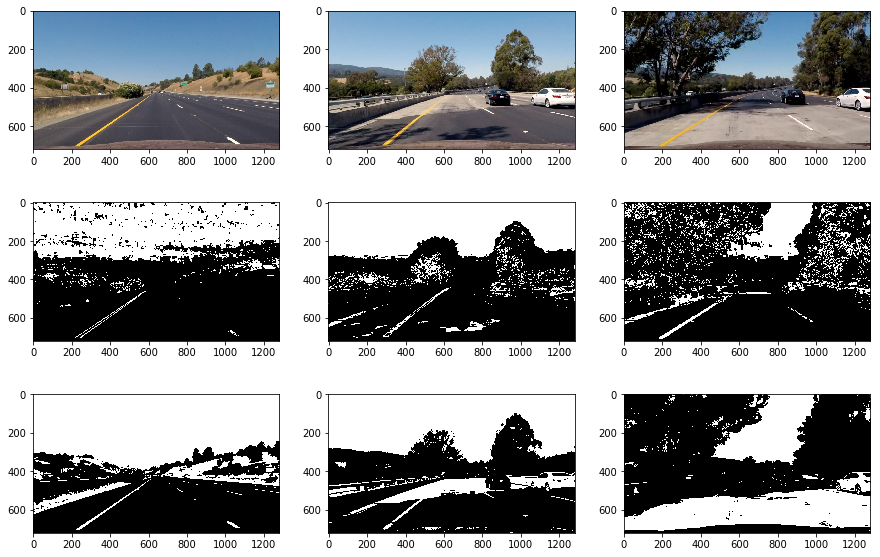

In [145]:
from CameraCalib import *

sThrUp = 240
sThrLw = 100
vThrUp = 255
vThrLw = 155

#TestImages : Straight_lines1, test4, test5 are used here.
index = (0, 5, 6) #selected images
plt.figure(figsize=(15,10))
for i in (0,1,2):
    plt.subplot(3, 3, 1+i)
    plt.imshow(bgr2rgb(undistTestImgs[index[i]]))
    
    hls=bgr2hls(undistTestImgs[index[i]])
    hlsBin = np.zeros_like(hls[:,:,2])
    hlsBin[(hls[:,:,2] >= sThrLw) & (hls[:,:,2] <= sThrUp)] = 1
    plt.subplot(3, 3, 4+i)
    plt.imshow(hlsBin, cmap='gray')
    
    hsv=bgr_hsv(undistTestImgs[index[i]])
    hsvBin = np.zeros_like(hls[:,:,2])
    hsvBin[(hsv[:,:,2] >= vThrLw) & (hsv[:,:,2] <= vThrUp)] = 1
    plt.subplot(3, 3, 7+i)
    plt.imshow(hsvBin, cmap='gray')

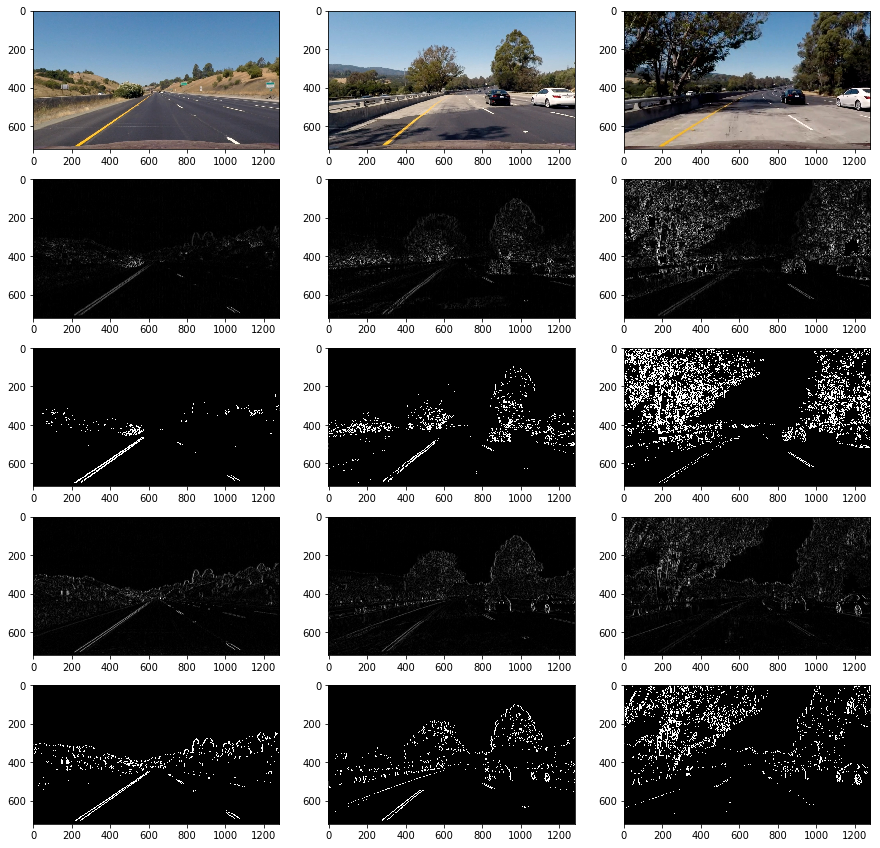

In [146]:
from CameraCalib import *

# Gradients of trasforms 
hlsLowThr = 40
hlsUpThr  = 255
hsvLowThr = 40
hsvUpThr  = 255
sobelKernel = 9

#TestImages : Straight_lines1, test4, test5 are used here.
index=(0, 5, 6)
plt.figure(figsize=(15,15))
for i in (0,1,2):
    plt.subplot(5, 3, 1+i)
    plt.imshow(bgr2rgb(undistTestImgs[index[i]])) #convert from bgr to rgb because of cv2
    
    hls=bgr2hls(undistTestImgs[index[i]])
    b1, s1=Sobel(hls[:,:,2], sobel_kernel=sobelKernel, alpha=0, thresh=(hlsLowThr, hlsUpThr))
    plt.subplot(5, 3, 4+i)
    plt.imshow(s1, cmap='gray')
    plt.subplot(5, 3, 7+i)
    plt.imshow(b1, cmap='gray')
    
    hsv=bgr_hsv(undistTestImgs[index[i]])
    b2, s2=Sobel(hsv[:,:,2], sobel_kernel=sobelKernel, alpha=0, thresh=(hsvLowThr, hsvUpThr))
    plt.subplot(5, 3, 10+i)
    plt.imshow(s2, cmap='gray')
    plt.subplot(5, 3, 13+i)
    plt.imshow(b2, cmap='gray')
    

In [152]:
#Step 3 : Use color transforms, gradients, etc., to create a thresholded binary image.
#From the above image transforms analysis the pipeline is as followed with thresholds for different transforms

from CameraCalib import *

def BinaryPipeline(img):
    hlsLowThr = 40
    hlsUpThr  = 255
    hsvLowThr = 40
    hsvUpThr  = 255
    sThrUp = 240
    sThrLw = 100
    sobelKernel = 9
    hls=bgr2hls(img) # HLS transformation
    hsv=bgr_hsv(img) # HSV transformation
    
    #compute binary image based on color threshold on S channel
    hlsBin = np.zeros_like(hls[:,:,2])
    #hlsBin[(normstreet(hls[:,:,2]) >= 110) & (normstreet(hls[:,:,2]) <= 240)] = 1    
    hlsBin[((hls[:,:,2]) >= sThrLw) & ((hls[:,:,2]) <= sThrUp)] = 1
    binary = np.zeros_like(hlsBin)
    
    bHLS, sHLS=Sobel(hls[:,:,2], sobel_kernel=sobelKernel, alpha=0, thresh=(hlsLowThr, hlsUpThr))
    bHSV, sHSV=Sobel(hsv[:,:,2], sobel_kernel=sobelKernel, alpha=0, thresh=(hsvLowThr, hsvUpThr))
    binary[(binary==1) | (bHLS==1) | (bHSV==1)] = 1    
    binary[(binary==1) | (hlsBin==1)] = 1
    return binary

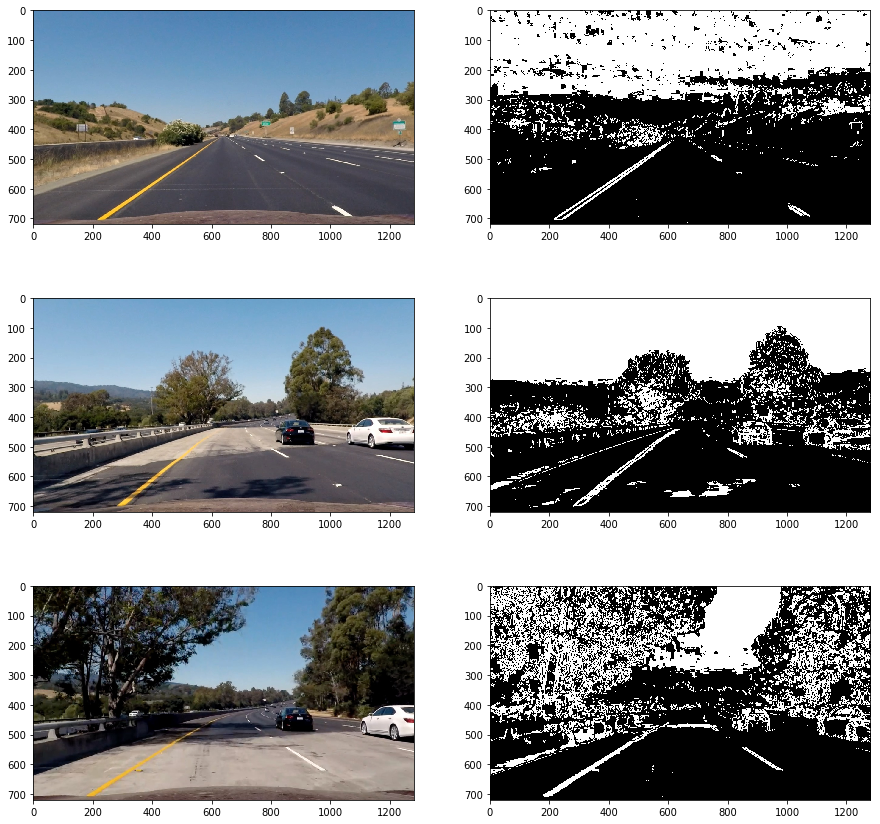

In [153]:
from CameraCalib import *

#TestImages : Straight_lines1, test4, test5 are used here.
index=(0, 5, 6)
plt.figure(figsize=(15,15))
for i in (0,1,2):
    plt.subplot(3, 2, 1+i*2)
    plt.imshow(bgr2rgb(undistTestImgs[index[i]])) #convert from bgr to rgb because of cv2
    s=BinaryPipeline(undistTestImgs[index[i]])
    plt.subplot(3, 2, 2+i*2)
    plt.imshow(s, cmap='gray')


In [202]:
def srcdst():
    height =720
    src=np.float32([[596, 450], [686, 450], [1027, height-50], [276, height-50]])
    offset=100
    dst = np.float32([[305, offset], [1005, offset], [1005, height-1],[305, height-1]])
    return src,dst

def SrcDst(height,width):
    #height, width = image.shape[0], image.shape[1]
    output_size = height/2
    top=70
    bottom=370
    src = np.float32([[(width/2) - top, height*0.65], [(width/2) + top, height*0.65], [(width/2) + bottom, height-50], [(width/2) - bottom, height-50]])
    dst = np.float32([[(width/2) - output_size, (height/2) - output_size], [(width/2) + output_size, (height/2) - output_size], [(width/2) + output_size, (height/2) + output_size], [(width/2) - output_size, (height/2) + output_size]])
    return src,dst


def warpFunction(image,src,dst):
    M = cv2.getPerspectiveTransform(src, dst)
    return cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]))

def UnwarpFunction(image,src,dst):
    M = cv2.getPerspectiveTransform(dst, src)
    return cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]))

[[  596.   450.]
 [  686.   450.]
 [ 1027.   670.]
 [  276.   670.]]
[[  305.   100.]
 [ 1005.   100.]
 [ 1005.   719.]
 [  305.   719.]]


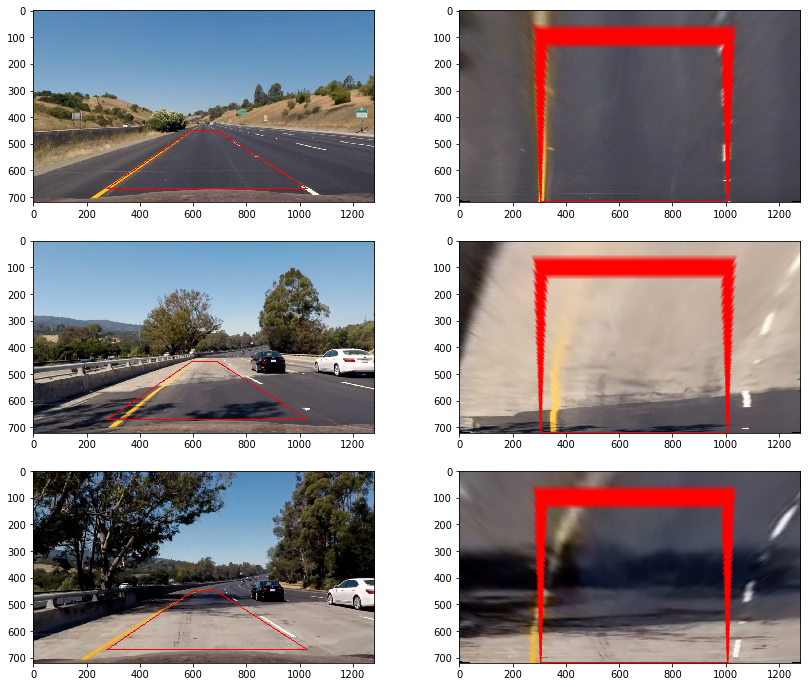

In [211]:
#Step 4 : Apply a perspective transform
#TestImages : Straight_lines1, test4, test5 are used here.
index=(0, 5, 6)
src,dst = srcdst() #get the hardcoded values for source and destination for the figure size 14x12
print(src)
print(dst)
plt.figure(figsize=(14,12))
for i in (0,1,2):
    plt.subplot(3, 2, 1+i*2)
    RGBImage=bgr2rgb(undistTestImgs[index[i]])
    #src,dst = SrcDst(rgb.shape[0],rgb.shape[1])
    cv2.polylines(RGBImage, np.int_([src]), 1, (255,0,0), 2) #2 is the thickness
    plt.imshow(RGBImage)
    warped = warpFunction(RGBImage,src,dst)
    cv2.polylines(warped, np.int_([dst]), 1, (255,0,0), 2) #2 is the thickness
    plt.subplot(3, 2, 2+i*2)
    plt.imshow(warped)

    

[[  596.   450.]
 [  686.   450.]
 [ 1027.   670.]
 [  276.   670.]]
[[  305.   100.]
 [ 1005.   100.]
 [ 1005.   719.]
 [  305.   719.]]


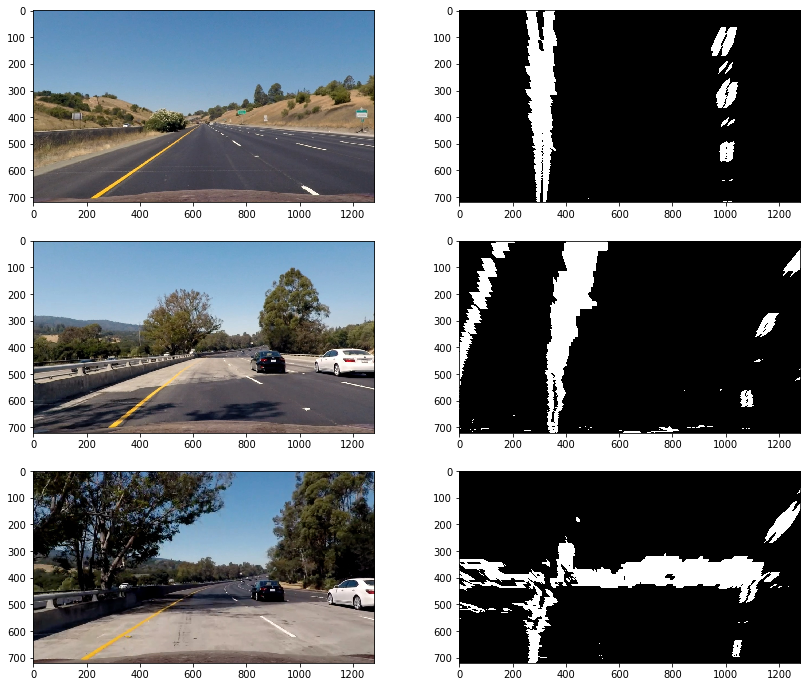

In [216]:
#Here we see that the lines or the gradients get smoothened after perspective transformation
#We shall see how perspective transformation works on binary images from binary pipeline
from CameraCalib import *

#TestImages : Straight_lines1, test4, test5 are used here.
index=(0, 5, 6)
src,dst = srcdst() #get the hardcoded values for source and destination for the figure size 14x12
print(src)
print(dst)
plt.figure(figsize=(14,12))
for i in (0,1,2):
    plt.subplot(3, 2, 1+i*2)
    RGBImage=bgr2rgb(undistTestImgs[index[i]])
    cv2.polylines(rgb_poly, np.int_([src]), 1, (255,0,0), 2) #2 is the thickness
    plt.imshow(RGBImage)
    binary = BinaryPipeline(RGBImage)
    warped = warpFunction(binary,src,dst)
    plt.subplot(3, 2, 2+i*2)
    plt.imshow(warped, cmap='gray')



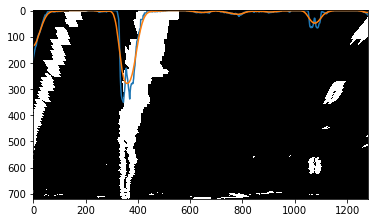

In [253]:
#Step 5: Detect lane pixels and fit to find the lane boundary.
#Apply the histogram as described in the lesson.
#A part of the code is taken from the lecture.
import scipy.ndimage as ndimage

#TestImages : Straight_lines1, test4, test5 are used here
index = (0,5,6)
src,dst = srcdst()
IMG1 = undistTestImgs[index[1]]
binaryIMG1 = BinaryPipeline(IMG1)
warpedIMG1 = warpFunction(binaryIMG1,src,dst)
plt.imshow(warpedIMG1, cmap='gray')

#One can take the histogram at lower part of image only the half part.
histogramIMG1 = np.sum(warpedIMG1[360:,:], axis=0)
#histogramIMG1 = np.sum(warpedIMG1, axis=0)
plt.plot(histogramIMG1)

#Gaussian filter for smoothing.
histogramIMG1Filt = ndimage.gaussian_filter(histogramIMG1, sigma=14, order=0)
plt.plot(histogramIMG1Filt)


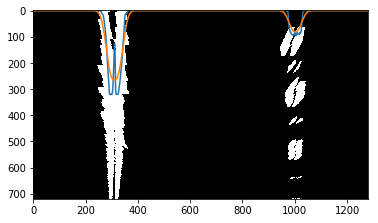

In [235]:
IMG2 = undistTestImgs[index[0]]
binaryIMG2 = BinaryPipeline(IMG2)
warpedIMG2 = warpFunction(binaryIMG2,src,dst)
plt.imshow(warpedIMG2, cmap='gray')

#One can take the histogram at lower part of image only the half part.
histogramIMG2 = np.sum(warpedIMG2[400:,:], axis=0)
plt.plot(histogramIMG2)

#Gaussian filter for smoothing.
histogramIMG2Filt = ndimage.gaussian_filter(histogramIMG2, sigma=14, order=0)
plt.plot(histogramIMG2Filt)

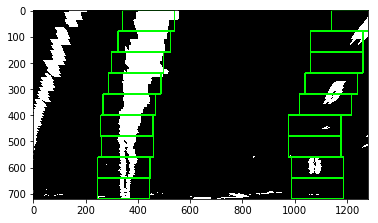

In [259]:
#Finding the lanes by looking for the maximum values in the histogram in the left and the right half.
#Iteration process : Draw the windows on an output image for illustration This is not present in the pipeline basically. 
#The loop iteratively recenters the windows on the lanes and identifies the pixels which are present inside the windows

import numpy as np

#To find these peaks in the left and right lanes which will be the starting point
centerPoint = np.int(histogramIMG1.shape[0]/2)
leftLaneB  = np.argmax(histogramIMG1[:centerPoint])
rightLaneB = np.argmax(histogramIMG1[centerPoint:]) + centerPoint

# Choose the number of sliding windows
WinNo = 9
# Set height of windows
windowHt = np.int(warpedIMG1.shape[0]/WinNo)

#Identify the x and y positions of all nonzero pixels in the image
nonzero = warpedIMG1.nonzero() #returns indices of elements which are nonzero.
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftLaneC  = leftLaneB  #set the base to the current
rightLaneC = rightLaneB #set the base to the current
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 200
# Create empty lists to receive left and right lane pixel indices
leftLaneIn  = []
rightLaneIn = []

# Create an output image to draw on and  visualize the result
out_img = np.dstack((warpedIMG1, warpedIMG1, warpedIMG1))*255
# Step through the windows one by one
for window in range(WinNo):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = warpedIMG1.shape[0] - (window+1)*windowHt
    win_y_high = warpedIMG1.shape[0] - window*windowHt
    win_xleft_low = leftLaneC - margin
    win_xleft_high = leftLaneC + margin
    win_xright_low = rightLaneC - margin
    win_xright_high = rightLaneC + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    leftLaneIn.append(good_left_inds)
    rightLaneIn.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftLaneC = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightLaneC = np.int(np.mean(nonzerox[good_right_inds]))

plt.imshow(out_img)

# Concatenate the arrays of indices
leftLaneIn = np.concatenate(leftLaneIn)
rightLaneIn = np.concatenate(rightLaneIn)


Finally get the x and y positions of the nonzero pixels identified by the index lists, and perform a second order polynomial fit. This then allows to extract lane curvature and slope, which will be the next step.

In [260]:
# Extract left and right line pixel positions
leftx = nonzerox[leftLaneIn]
lefty = nonzeroy[leftLaneIn] 
rightx = nonzerox[rightLaneIn]
righty = nonzeroy[rightLaneIn] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)


(720, 0)

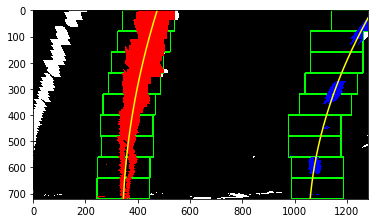

In [261]:
#To draw the lane pixels and the polynomials on the warped image, code snipped is used from lecture
# Generate x and y values for plotting
ploty = np.linspace(0, warpedIMG1.shape[0]-1, warpedIMG1.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[leftLaneIn], nonzerox[leftLaneIn]] = [255, 0, 0]
out_img[nonzeroy[rightLaneIn], nonzerox[rightLaneIn]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)



In [267]:
def findLanes(warped, sigma=20, nwindows = 9, margin = 100, minpix = 200, ym_per_pix = 3/50, xm_per_pix = 3.7/700):
   
    histogram = np.sum(warped[360:,:], axis=0) #take the half of the image size 720/2    
    histogramF = ndimage.gaussian_filter(histogram, sigma=14, order=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogramF.shape[0]/2)
    leftLaneB = np.argmax(histogramF[:midpoint])
    rightLaneB = np.argmax(histogramF[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftLaneC = leftLaneB
    rightLaneC = rightLaneB
    
    # Create empty lists to receive left and right lane pixel indices
    leftLaneIn = []
    rightLaneIn = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped.shape[0] - (window+1)*window_height
        win_y_high = warped.shape[0] - window*window_height
        win_xleft_low = leftLaneC - margin
        win_xleft_high = leftLaneC + margin
        win_xright_low = rightLaneC - margin
        win_xright_high = rightLaneC + margin

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        leftLaneIn.append(good_left_inds)
        rightLaneIn.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftLaneC = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightLaneC = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    leftLaneIn = np.concatenate(leftLaneIn)
    rightLaneIn = np.concatenate(rightLaneIn)

    # Extract left and right line pixel positions
    leftx = nonzerox[leftLaneIn]
    lefty = nonzeroy[leftLaneIn] 
    rightx = nonzerox[rightLaneIn]
    righty = nonzeroy[rightLaneIn]
    
    # Fit a second order polynomial to each, in meters
    left_fit = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    return nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit


In [268]:
# ym_per_pix = 30/720 # meters per pixel in y dimension
# xpix_per_m = 700/3.7 # pixels per meter in x dimension
def drawLanes(warped, nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit, ym_per_pix = 3/50, xpix_per_m = 700/3.7, col_line=(0, 255, 255)):
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = (left_fit[0]*(ploty*ym_per_pix)**2 + left_fit[1]*(ploty*ym_per_pix) + left_fit[2])*xpix_per_m
    right_fitx = (right_fit[0]*(ploty*ym_per_pix)**2 + right_fit[1]*(ploty*ym_per_pix) + right_fit[2])*xpix_per_m

    if (len(warped.shape)==2):
        out_img=np.dstack((warped, warped, warped))*255
    else:
        out_img=np.uint8(warped)
    
    out_img[nonzeroy[leftLaneIn], nonzerox[leftLaneIn]] = [255, 0, 0]
    out_img[nonzeroy[rightLaneIn], nonzerox[rightLaneIn]] = [0, 0, 255]
    pts = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    out_img=cv2.polylines(out_img, np.int32(pts), 0, col_line, 2)
    pts = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    out_img=cv2.polylines(out_img, np.int32(pts), 0, col_line, 2)
    
    return out_img

In [273]:
def findLanesReuse(warped, left_fit, right_fit, margin = 100, ym_per_pix = 3/50, xm_per_pix = 3.7/700):
        
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    nonzeroym = nonzeroy*ym_per_pix
    nonzeroxm = nonzerox*xm_per_pix

    lf=left_fit[0]*(nonzeroym**2) + left_fit[1]*nonzeroym + left_fit[2]
    rf=right_fit[0]*(nonzeroym**2) + right_fit[1]*nonzeroym + right_fit[2]
    lm= margin*xm_per_pix
    rm= margin*xm_per_pix
    leftLaneIn = ((nonzeroxm > (lf - lm)) & 
                      (nonzeroxm < (lf + lm))) 
    rightLaneIn = ((nonzeroxm > (rf - rm)) & 
                       (nonzeroxm < (rf + rm)))  

    # Again, extract left and right line pixel positions in meters
    leftx = nonzeroxm[leftLaneIn]
    lefty = nonzeroym[leftLaneIn] 
    rightx = nonzeroxm[rightLaneIn]
    righty = nonzeroym[rightLaneIn]
    # Fit a second order polynomial to each, in meters
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit

findLanes() -- Finds the lanes using windows
drawLanes() -- Lane finding with windows drawn
drawLanesW()-- Explained in later part. Illustration of the lane finding (without the windows being drawn). 
findLanesReuse() -- uses polynomial coefficients from the previous step, as described in the lecture. The coefficients for the second order polynomial are computed here with a unit conversion from pixels to meters, which is required for the computation of curvature in meters.

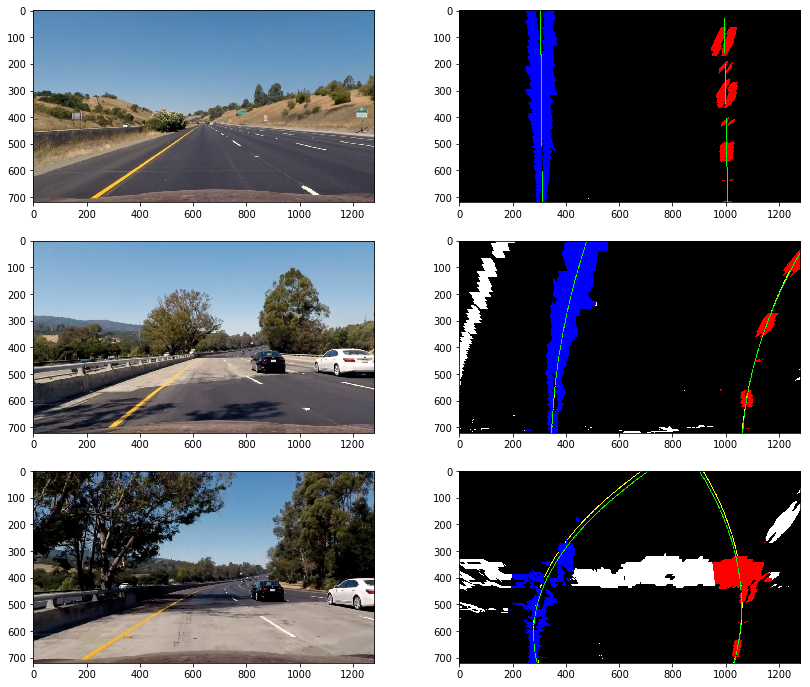

In [274]:
index=(0, 5, 6)
plt.figure(figsize=(14,12))
src,dst = srcdst()
for i in (0,1,2):
    plt.subplot(3, 2, 1+i*2)
    IMG = bgr2rgb(undistTestImgs[index[i]])
    plt.imshow(IMG)
    binary = BinaryPipeline(undistTestImgs[index[i]])
    warped = warpFunction(binary,src,dst)
    nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit = findLanes(warped, minpix=200)
    img = drawLanes(warped, nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit)
    nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit = findLanesReuse(warped, left_fit, right_fit)
    img = drawLanes(img, nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit, col_line=(0, 255, 0))
    plt.subplot(3, 2, 2+i*2)
    plt.imshow(bgr2rgb(img))
    
#In the third image, its not stable. But using the previous frame will improve the situation.


In [279]:
#Step 6 : Determine the curvature of the lane and vehicle position with respect to center.
ym_per_pix = 3/50
y_eval=720
y_m=y_eval*ym_per_pix
xm_per_pix = 3.7/700
x_eval=undistTestImgs[index[1]].shape[1]/2
x_m=x_eval*xm_per_pix
src,dst = srcdst()
index =(0, 5, 6)
for i in (0,1,2):
    binary=BinaryPipeline(undistTestImgs[index[i]])
    warped = warpFunction(binary, src,dst)
    nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit = findLanes(
        warped, ym_per_pix = 3/50, xm_per_pix = 3.7/700)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit[0]*y_m + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_m + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    # Calculate the position of the car. First: position of the two lanes, midpoint:
    pos_left = left_fit[0]*y_m**2 + left_fit[1]*y_m + left_fit[2]
    pos_right = right_fit[0]*y_m**2 + right_fit[1]*y_m + right_fit[2]
    pos_mid = 0.5 * (pos_right + pos_left)
    # difference to center of the image
    pos_car = x_m - pos_mid
    # Radius of curvature in meters
    print('Radius: ', left_curverad, 'm', right_curverad, 'm; Pos. Car: ', pos_car, 'm')


Radius:  88402.8493126 m 36997.7663136 m; Pos. Car:  -0.0979311953439 m
Radius:  1768.60384691 m 1020.6767835 m; Pos. Car:  -0.334520082771 m
Radius:  288.735201654 m 561.836254774 m; Pos. Car:  -0.128314797198 m


In [ ]:
#Code snipped is taken from lecture course
def drawLanes(img,src,dst, left_fit, right_fit, ym_per_pix = 3/50, xpix_per_m = 700/3.7):
    # Create an image to draw the lines on
    color_warp = np.zeros_like(img).astype(np.uint8)
    # y values
    ploty = np.linspace(0, 720-1, num=720)
    # convert to meters
    plotym = ym_per_pix * ploty
    # evaluate polynomial & convert to pixels
    left_fitxm = left_fit[0]*plotym**2 + left_fit[1]*plotym + left_fit[2]
    left_fitx = xpix_per_m * left_fitxm
    right_fitxm = right_fit[0]*plotym**2 + right_fit[1]*plotym + right_fit[2]
    right_fitx = xpix_per_m * right_fitxm

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix, ie UnwwarpFunction()
    newwarp = UnwarpFunction(color_warp,src,dst)
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    return result

- Visualization
 Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.
The drawLanes() function has the code snippets from the lecture

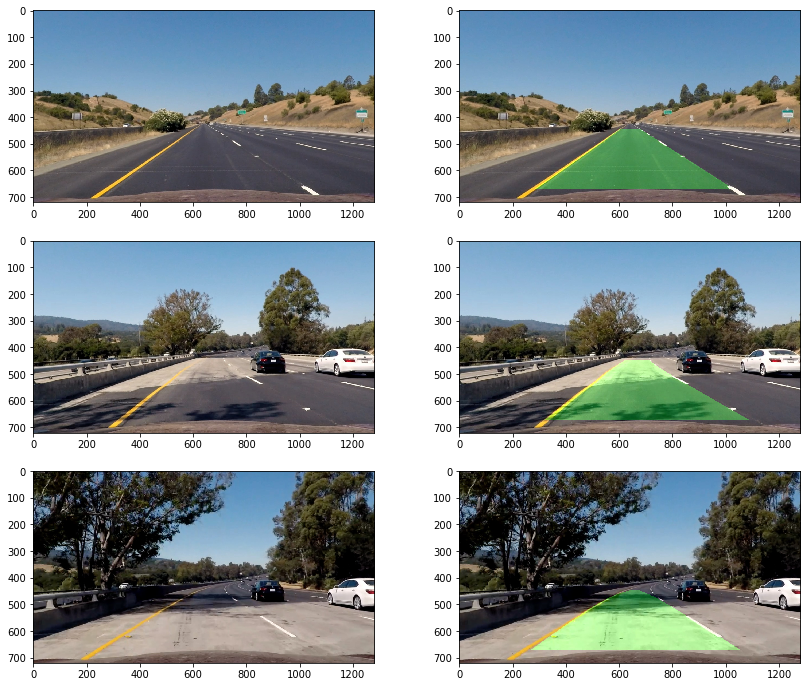

In [284]:
#Test images used are 0,5,6
index=(0, 5, 6)
src,dst = srcdst()
plt.figure(figsize=(14,12))
for i in (0,1,2):
    plt.subplot(3, 2, 1+i*2)
    IMG=bgr2rgb(undistTestImgs[index[i]])
    plt.imshow(IMG)
    binary=BinaryPipeline(undistTestImgs[index[i]])
    warped = warpFunction(binary,src,dst)
    nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit = findLanes(warped)
    img = drawLanes(undistTestImgs[index[i]],src,dst, left_fit, right_fit)
    plt.subplot(3, 2, 2+i*2)
    plt.imshow(bgr2rgb(img))
    


In [294]:
#Part of the video generation pipeline is discussed with my Mentor, discussions from Slack community and one of the fellow graduated Udacity student Mr.Alexander Braun

from Pipeline import *
binary=BinaryPipeline(undistTestImgs[5])
warped = warpFunction(binary,src,dst)
nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit5, right_fit5 = findLanes(warped)
binary=BinaryPipeline(undistTestImgs[6])
warped = warpFunction(binary,src,dst)
nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit6, right_fit6 = findLanes(warped)

In [298]:
def toParam(left_coeff, right_coeff, w=1280*3.7/700, y_m=720*3/50):
    # computing the curvature radii
    left_curverad_pm = ((1 + (2*left_coeff[0]*y_m + left_coeff[1])**2)**1.5) / (2*left_coeff[0])
    right_curverad_pm = ((1 + (2*right_coeff[0]*y_m + right_coeff[1])**2)**1.5) / (2*right_coeff[0])
    # computing the car's position
    pos_left = left_coeff[0]*y_m**2 + left_coeff[1]*y_m + left_coeff[2]
    pos_right = right_coeff[0]*y_m**2 + right_coeff[1]*y_m + right_coeff[2]
    pos_mid = 0.5 * (pos_right + pos_left)
    # difference to center of the image
    pos_car = w/2 - pos_mid
    # lane distance
    dist_lanes = pos_right - pos_left
    # angles
    alpha_left  = np.arcsin(2*left_coeff[0]*y_m + left_coeff[1])
    alpha_right = np.arcsin(2*right_coeff[0]*y_m + right_coeff[1])
    return pos_car, dist_lanes, alpha_left, alpha_right, left_curverad_pm, right_curverad_pm

def toCoeff(pos_car, dist_lanes, alpha_left, alpha_right, left_curverad_pm, right_curverad_pm, w=1280*3.7/700, y_m=720*3/50):
    sal=np.sin(alpha_left)
    sar=np.sin(alpha_right)
    A_left  = (1+sal**2)**1.5/(2*left_curverad_pm)
    A_right = (1+sar**2)**1.5/(2*right_curverad_pm)
    B_left  = sal - 2*A_left*y_m
    B_right = sar - 2*A_right*y_m
    C_left  = 0.5*(w - dist_lanes) - pos_car - A_left *y_m**2 - B_left*y_m
    C_right = 0.5*(w + dist_lanes) - pos_car - A_right*y_m**2 - B_right*y_m
    left_coeff  = np.array([A_left,  B_left,  C_left])
    right_coeff = np.array([A_right, B_right, C_right])
    return left_coeff, right_coeff

# Define a class to receive the characteristics of each line detection
class LaneLines():
    def __init__(self, coeff=None, coeff2=None, params=None):
        if coeff2:
            lc2=coeff2[0]; rc2=coeff2[1]
            lc=[lc2[0], -(2*lc2[0]*720*3/50+lc2[1]), lc2[0]*(720*3/50)**2+lc2[1]*720*3/50+lc2[2]]
            rc=[rc2[0], -(2*rc2[0]*720*3/50+rc2[1]), rc2[0]*(720*3/50)**2+rc2[1]*720*3/50+rc2[2]]
            coeff=[lc, rc]
        if coeff:
            pos_car, dist_lanes, alpha_left, alpha_right, left_curverad_pm, right_curverad_pm = toParam(coeff[0], coeff[1])
            self.pos_car=pos_car
            self.dist_lanes=dist_lanes
            self.alpha_left=alpha_left
            self.alpha_right=alpha_right
            self.curverad_left=left_curverad_pm
            self.curverad_right=right_curverad_pm
        elif params:
            self.pos_car=params[0]
            self.dist_lanes=params[1]
            self.alpha_left=params[2]
            self.alpha_right=params[3]
            self.curverad_left=params[4]
            self.curverad_right=params[5]
        else:
            self.pos_car=None
            self.dist_lanes=None
            self.alpha_left=None
            self.alpha_right=None
            self.curverad_left=None
            self.curverad_right=None
            
    def toParam(self):
        return self.pos_car, self.dist_lanes, self.alpha_left, self.alpha_right, self.curverad_left, self.curverad_right
    
    def toCoeff(self):
        return toCoeff(self.pos_car, self.dist_lanes, self.alpha_left, self.alpha_right, self.curverad_left, self.curverad_right)
    
    def toCoeff2(self):
        lc, rc=self.toCoeff()
        lc2=[lc[0], -(2*lc[0]*720*3/50+lc[1]), lc[0]*(720*3/50)**2+lc[1]*720*3/50+lc[2]]
        rc2=[rc[0], -(2*rc[0]*720*3/50+rc[1]), rc[0]*(720*3/50)**2+rc[1]*720*3/50+rc[2]]
        return lc2, rc2
        
    def plausibleNew(self, newLaneLines):
        new_coeff2=np.array(newLaneLines.toCoeff2())
        nlc2=new_coeff2[0]; nrc2=new_coeff2[1]
        old_coeff2=np.array(self.toCoeff2())
        olc2=old_coeff2[0]; orc2=old_coeff2[1]
        
        sigma2=0.1; sigma0=0.001; sigma_alpha=np.pi/6
        wl=np.exp(-0.5*((nlc2[2]-olc2[2])/sigma2)**2) * np.exp(
            -0.5*(nlc2[0]/sigma0)**2) * np.exp( -0.5*(newLaneLines.alpha_left/sigma_alpha)**2 )
        wr=np.exp(-0.5*((nrc2[2]-orc2[2])/sigma2)**2) * np.exp(
            -0.5*(nrc2[0]/sigma0)**2) * np.exp( -0.5*(newLaneLines.alpha_right/sigma_alpha)**2 )
        
        wl=min(0.25, wl); wr=min(0.25, wr)
        plc2=wl*nlc2+(1-wl)*olc2
        prc2=wr*nrc2+(1-wr)*orc2
        plaus_coeff2=np.array([plc2, prc2])
        plausLaneLines=LaneLines(coeff2=plaus_coeff2.tolist())
        return plausLaneLines

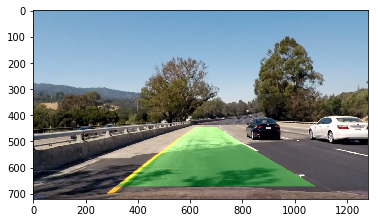

In [303]:
ll5 = LaneLines(coeff=[left_fit5, right_fit5])
ll6 = LaneLines(coeff=[left_fit6, right_fit6])
llProb = ll5.plausibleNew(ll6)
ll5.__dict__, ll6.__dict__, llProb.__dict__

src,dst = srcdst()
lc, rc=llProb.toCoeff()
img = drawLanes(undistTestImgs[5],src,dst, lc, rc)
plt.imshow(bgr2rgb(img))


In [306]:
def drawLanesW(warped, nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit, ym_per_pix = 3/50, xpix_per_m = 700/3.7, col_line=(0, 255, 255)):
    # ym_per_pix = 30/720 # meters per pixel in y dimension
    # xpix_per_m = 700/3.7 # pixels per meter in x dimension
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = (left_fit[0]*(ploty*ym_per_pix)**2 + left_fit[1]*(ploty*ym_per_pix) + left_fit[2])*xpix_per_m
    right_fitx = (right_fit[0]*(ploty*ym_per_pix)**2 + right_fit[1]*(ploty*ym_per_pix) + right_fit[2])*xpix_per_m

    if (len(warped.shape)==2):
        out_img=np.dstack((warped, warped, warped))*255
    else:
        out_img=np.uint8(warped)
    
    out_img[nonzeroy[leftLaneIn], nonzerox[leftLaneIn]] = [255, 0, 0]
    out_img[nonzeroy[rightLaneIn], nonzerox[rightLaneIn]] = [0, 0, 255]
    pts = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    out_img=cv2.polylines(out_img, np.int32(pts), 0, col_line, 2)
    pts = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    out_img=cv2.polylines(out_img, np.int32(pts), 0, col_line, 2)
    
    return out_img

In [316]:
from moviepy.editor import VideoFileClip

class ProcessImage():
    def __init__(self, text_file):
        self.oldLaneLines=None
        self.text_file=text_file
        self.invR=0
    def __call__(self, image):
        # NOTE: The output you return should be a color image (3 channel) for processing video below
        # TODO: put your pipeline here,
        # you should return the final output (image with lines are drawn on lanes)
        src,dst = srcdst()
        bgr=rgb2bgr(image)
        binary=BinaryPipeline(bgr)
        warped = warpFunction(binary,src,dst)
        if self.oldLaneLines:
            lc, rc = self.oldLaneLines.toCoeff()
            try:
                nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit = findLanesReuse(
                    warped, lc, rc)
            except:
                print("exception happened!", file=self.text_file)
                nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit = findLanes(warped)
        else:
            nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit = findLanes(warped)
            
        newLaneLines=LaneLines(coeff=[left_fit, right_fit])
        if self.oldLaneLines:
            probLaneLines=self.oldLaneLines.plausibleNew(newLaneLines)
            lc, rc=probLaneLines.toCoeff()
            if ((abs(lc[0])>0.001) | (abs(rc[0])>0.001)):
                print("unplausible high curvature!", file=self.text_file)
                nonzerox, nonzeroy, leftLaneIn, rightLaneIn, left_fit, right_fit = findLanes(warped)
                newLaneLines=LaneLines(coeff=[left_fit, right_fit])
                lc, rc=newLaneLines.toCoeff()
                if ((abs(lc[0])>0.0015) != (abs(rc[0])>0.0015)):
                    pos_car,dist_lanes,alpha_left,alpha_right,curverad_left,curverad_right=newLaneLines.toParam()
                    if (abs(lc[0])>0.0015):
                        alpha_left=alpha_right
                        curverad_left=curverad_right
                    else:
                        alpha_right=alpha_left
                        curverad_right=curverad_left
                    newLaneLines=LaneLines(params=[pos_car,dist_lanes,alpha_left,alpha_right,curverad_left,curverad_right])
                    
                probLaneLines=self.oldLaneLines.plausibleNew(newLaneLines)
                        
        else:
            probLaneLines=newLaneLines
            
        lc, rc=probLaneLines.toCoeff()
        result = drawLanes(bgr,src,dst, lc, rc)
        statimg= drawLanesW(warped, nonzerox, nonzeroy, leftLaneIn, rightLaneIn, lc, rc)
        lc2, rc2 = probLaneLines.toCoeff2()
        print(lc2, rc2, file=self.text_file)
        pos_car,dist_lanes,alpha_left,alpha_right,curverad_left,curverad_right=probLaneLines.toParam()
        curverad=0.5*(curverad_left+curverad_right)
        
        # inset image
        statimg=cv2.resize(statimg, None, fx=1/4, fy=1/4)
        y_offset=50; x_offset=result.shape[1]-2*statimg.shape[1]-80
        result[y_offset:y_offset+statimg.shape[0], x_offset:x_offset+statimg.shape[1]] = statimg

        font = cv2.FONT_HERSHEY_SIMPLEX
        self.invR=0.7*self.invR+0.3*1/curverad
        cv2.putText(result,"R = {0:#0.1f}".format(1/self.invR),(50,100), font, 1,(255,255,255),2)
        cv2.putText(result,"pos = {0:#0.2f}".format(pos_car),(50,150), font, 1,(255,255,255),2)

        self.oldLaneLines=probLaneLines
        return bgr2rgb(result)

video_output = 'TestVideoOutput.mp4'
clip1 = VideoFileClip("project_video.mp4")

text_file = open("OutFile.txt", "w")
process_image=ProcessImage(text_file)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)
text_file.close()


[MoviePy] >>>> Building video TestVideoOutput.mp4
[MoviePy] Writing video TestVideoOutput.mp4



 16%|██████▎                                | 203/1261 [00:37<03:13,  5.47it/s]


 32%|████████████▌                          | 407/1261 [01:13<02:28,  5.74it/s]


 48%|██████████████████▉                    | 611/1261 [01:50<02:01,  5.35it/s]


 65%|█████████████████████████▏             | 815/1261 [02:27<01:19,  5.63it/s]


 81%|██████████████████████████████▋       | 1019/1261 [03:03<00:44,  5.49it/s]


 97%|████████████████████████████████████▊ | 1223/1261 [03:41<00:07,  5.35it/s]


100%|█████████████████████████████████████▉| 1260/1261 [03:48<00:00,  5.25it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: TestVideoOutput.mp4 

Wall time: 3min 49s


In [317]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))